In [ ]:
library('ggplot2')
library('reshape2')
library('ggpubr')
library(glmnet)
library(doMC)
library(survival)
library(data.table)
library(mltools)
library(CoxBoost)
library(randomForestSRC)
library(CoxHD)
library(Hmisc)
library(gridExtra)
library("survminer")
source("../../../src/tools.R")
options(repr.plot.res        = 100, # set a medium-definition resolution for the jupyter notebooks plots (DPI)
        repr.matrix.max.rows = 250, # set the maximum number of rows displayed
        repr.matrix.max.cols = 250) # set the maximum number of columns displayed

SVM is used as an intermediary because it comes from python and then it is integrated to each feature usage datasets.

In [2]:
#val_dl= c(0.7774745123223891,0.7838805490888657,0.7704904872762303,0.774985951673757,0.7695913943967247,0.7710042546359477,0.771132696475877,
#         0.7696395600866982,0.762045436300875,0.7690455165770249)
#w <- data.frame(model=rep('all_features',10),variable=rep("deep neural network",10),value=val_dl)
#write.table(w,"final_prognosis/neural_network_all_features.tsv",sep='\t')

In [3]:
SVM <- read.table("final_prognosis/SVM_comp.csv",sep=',',header=T)

list_models <- list.files('final_prognosis')[list.files('final_prognosis')!="SVM_comp.csv" & list.files('final_prognosis')!="age.tsv"
                                            & list.files('final_prognosis')!="neural_network_all_features.tsv"]
df_w_all <-NULL
for (l in list_models){
  tmp <- cbind(read.table(paste("final_prognosis",l,sep="/")),SVM_optimized=SVM[,substr(l,1,nchar(l)-4)])    
  tmp$model <- substr(l,1,nchar(l)-4)
  
  assign(substr(l,1,nchar(l)-4),melt(tmp,id='model')) 
  df_w_all <- rbind(df_w_all,get(substr(l,1,nchar(l)-4)))
}
## add dl
#w <- data.frame(model=rep('all_features',10),variable=rep("deep neural network",10),value=val_dl)
df_w_all <- rbind(read.table("final_prognosis/neural_network_all_features.tsv"),df_w_all)
colnames(df_w_all) <- c('model','algorithm','CI_test')
model_medians<-c()
df_w_all$model<-factor(df_w_all$model,levels=substr(list_models,1,nchar(list_models)-4))
for( model in levels(df_w_all$model)){

   model_medians <- c(model_medians,median(df_w_all$CI_test[df_w_all$model==as.character(model)],na.rm=T))
}
model_medians<-data.frame(model=levels(df_w_all$model),Z=model_medians)

In [4]:
###### Preparation worst and best

In [5]:
tmp_top <- model_medians[order(model_medians$Z,decreasing=T),]
top <- tmp_top[tmp_top$Z>0.699,]
tmp_worst <- model_medians[order(model_medians$Z),]
worst <- tmp_worst[tmp_worst$Z<0.64,]
df_w_top <- df_w_all[is.element(df_w_all$model,unique(top$model)),]
df_w_worst <- df_w_all[is.element(df_w_all$model,unique(worst$model)),]

##### Conclusion: Clinical and demographical are the more important features for the prognosis models.
##### The eln is also an important parameter because it is solo and it definitely imporves prognosis

##### Of course adding genetical and cytogenetical data slightly improve the overallsurvival prognosis.
##### Adding genetical information or cytogenetical information of component information has the same effect on prognosis when we have clinical and demographical features used for evaluation.

In [6]:
dim(df_w_all)

[1] 21010     3

# ALL MODELS

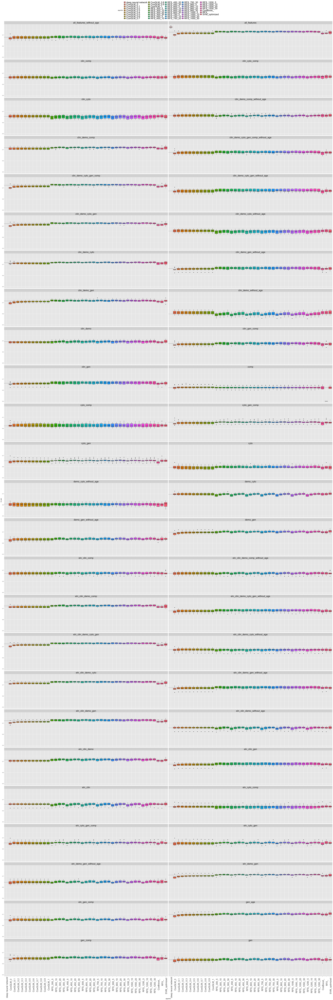

In [23]:
set_notebook_plot_size(40,120)
ggplot(df_w_all,aes(x=algorithm,y=CI_test)) +
    geom_boxplot(aes(fill = algorithm), notch=F)+
    #scale_fill_manual(values = c('#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69'))+
    facet_wrap( ~ model, ncol=2) +
    geom_hline(data = model_medians, aes(yintercept = Z), linetype = 2)+
    theme(legend.position="top",strip.text = element_text(size=20),axis.text.x = element_text(size=20,angle = 90, hjust = 0.8,vjust=0.8),legend.text=element_text(size=20)) 

# TOP MODELS >0.7

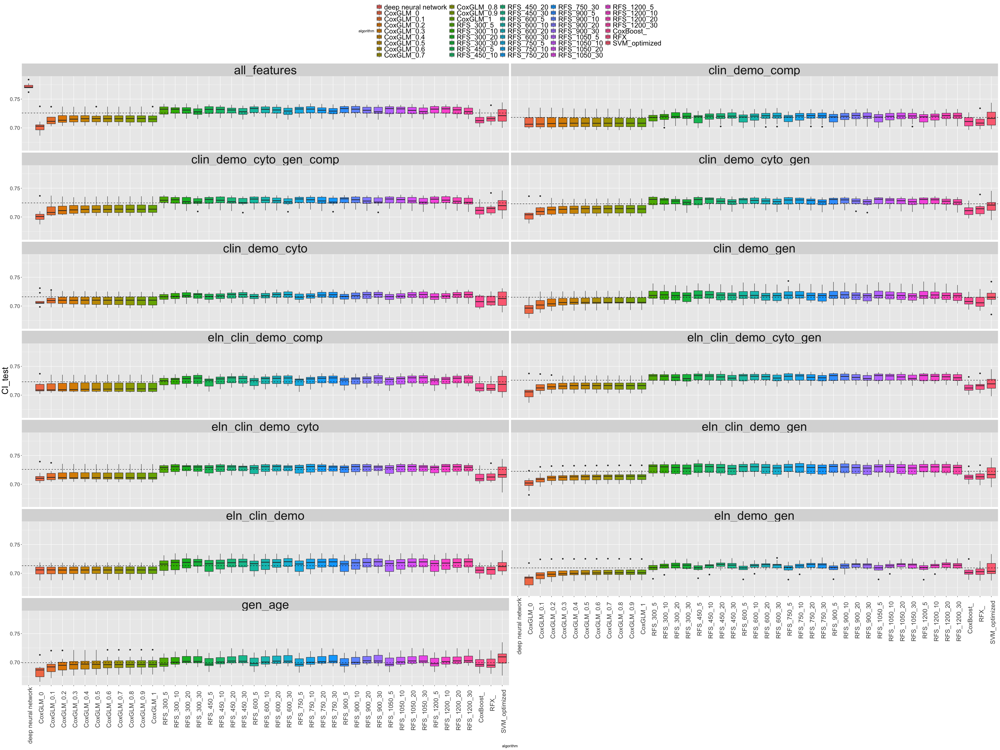

In [24]:
set_notebook_plot_size(40,30)
ggplot(df_w_top,aes(x=algorithm,y=CI_test)) +
    geom_boxplot(aes(fill = algorithm), notch=F)+
    #scale_fill_manual(values = c('#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69'))+
    facet_wrap( ~ model, ncol=2) +
    geom_hline(data = top, aes(yintercept = Z), linetype = 2)+
    theme(strip.text = element_text(size=35),legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y = element_text(size=15),axis.title.y=element_text(size=25),legend.text=element_text(size=20)) 

### For the good models, we have a trend and RFD do better than others (lots of features).
######This might be explained by the fact that the GLM Models are not able to perform feature selection if there are too many features.

# WORST MODELS <0.64

Warning message:
“Removed 766 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 2 rows containing missing values (geom_hline).”

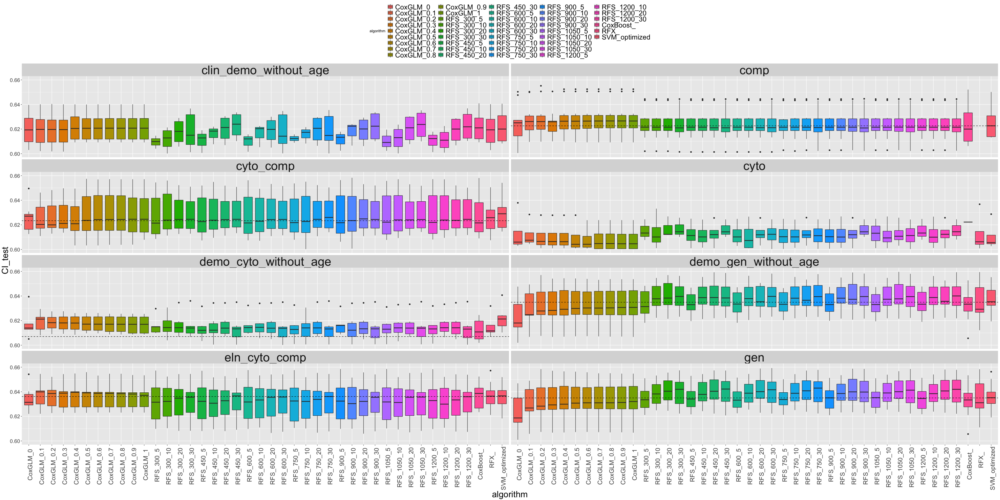

In [25]:
set_notebook_plot_size(40,20)
ggplot(df_w_worst,aes(x=algorithm,y=CI_test)) +
    geom_boxplot(aes(fill = algorithm), notch=F)+
    #scale_fill_manual(values = c('#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69'))+
    facet_wrap( ~ model, ncol=2) +
    geom_hline(data = worst, aes(yintercept = Z), linetype = 2)+
    theme(strip.text = element_text(size=35),legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y = element_text(size=15),axis.title.y=element_text(size=25),axis.title.x=element_text(size=25),legend.text=element_text(size=20))  +ylim(0.6,0.66)

### We prove it when we look at the worse models :
GLM perform better than RFS

### Model and Algorithms Performance visualization 

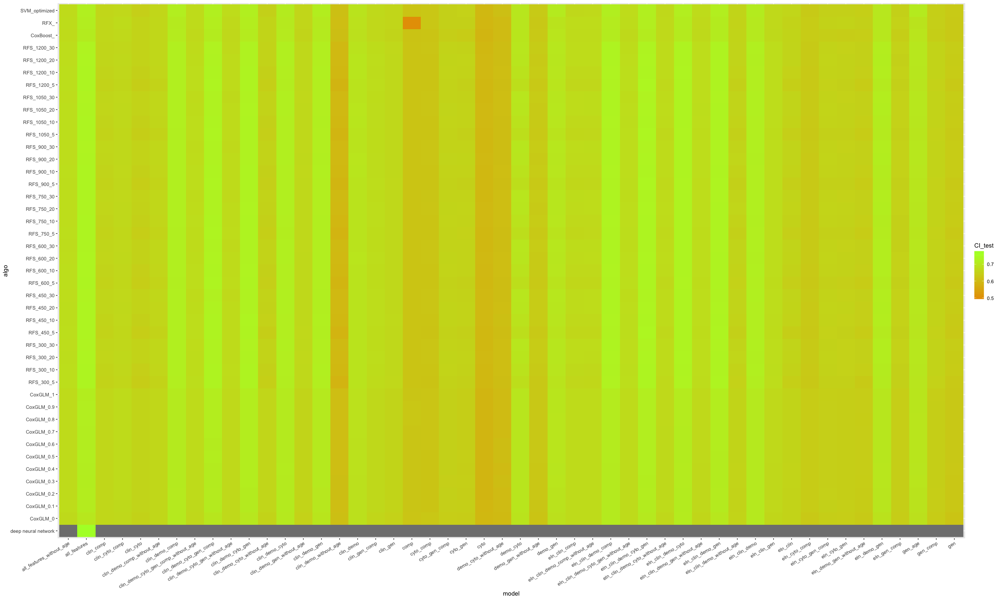

In [10]:
set_notebook_plot_size(25,15)
#nrow = number of prognosis models 
#ncol = number of feature models
table_res <- as.data.frame(matrix(0,nrow =length(unique(df_w_all$algorithm)), ncol=length(model_medians$model)))
colnames(table_res)<-levels(df_w_all$model)
rownames(table_res)<-levels(df_w_all$algorithm)

for(model in colnames(table_res)){
    for(algo in rownames(table_res)){
        table_res[algo,model]<-median(df_w_all$CI_test[df_w_all$model==model & df_w_all$algorithm==algo])
    }
}
row_names <-rownames(table_res)
table_res$algo<-rownames(table_res)
rownames(table_res)<-NULL
table_res<-melt(table_res,id='algo')
colnames(table_res)<-c('algo','model','CI_test')
table_res$algo<-factor(table_res$algo,levels=row_names)
table_res$model<-factor(table_res$model)
ggplot(table_res, aes(model, algo)) +

    # geom raster heatmap
    geom_raster(aes(fill = CI_test), show.legend = TRUE) +
    scale_fill_gradient(low="#e79f00", high="greenyellow") +
    tilt_x_label(30) 

# Model Performance Evaluation

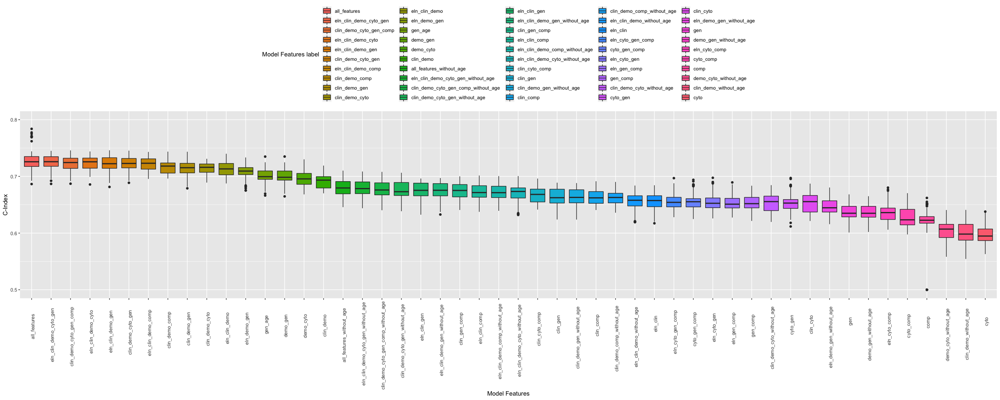

In [11]:
set_notebook_plot_size(25,10)
ggplot(df_w_all, aes(x=reorder(model, -CI_test),y=CI_test))+
geom_boxplot(aes(fill =reorder(model, -CI_test)), notch=F)+
theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+ylim(0.50,0.8)+xlab("Model Features")+ylab("C-Index")+labs(fill = " Model Features label")

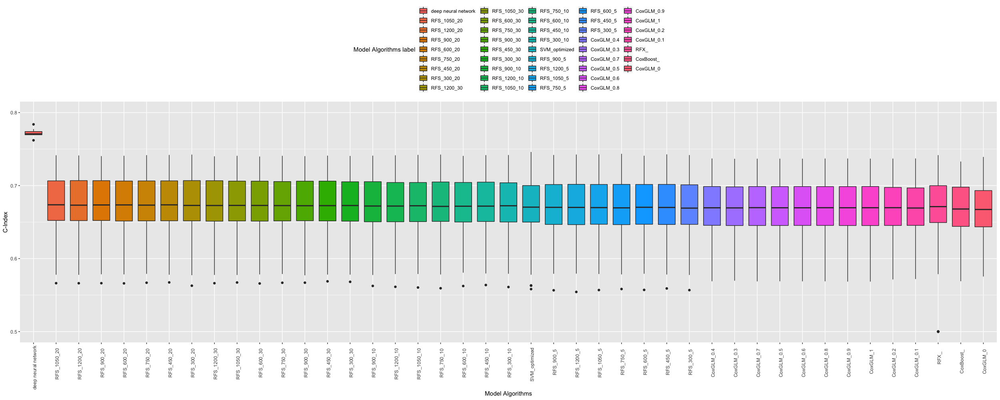

In [12]:
set_notebook_plot_size(25,10)
ggplot(df_w_all, aes(x=reorder(algorithm, -CI_test),y=CI_test))+
geom_boxplot(aes(fill =reorder(algorithm, -CI_test)), notch=F)+
theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8))+ylim(0.5,0.8)+xlab("Model Algorithms")+ylab("C-Index")+labs(fill = " Model Algorithms label")

# Evaluation of feature importance for different models 

In [16]:
df_final <- read.table("prognosis_comp_final.tsv",sep='\t',header=T)
### Features that we can use
###-----------------------------------------------------------------------------
all_features <-c(1:180) #not used
clin_demo_comp <-c(155:180) #not used
clin_demo_cyto_gen_comp <- c(2:180) #not used
comp <- c(164:180) #not used
cyto_comp <-c(86:154,164:180) #not used
cyto_gen_comp <- c(2:154,164:180) #not used
eln_clin_demo_comp <- c(1,155:180) #not used
eln_cyto_comp <- c(1,86:154,164:180) #not used
eln_cyto_gen_comp <- c(1:154,164:180) #not used
eln_gen_comp <- c(1:85,164:180) #not used
gen_comp <- c(2:85,164:180) #not used
clin_comp <- c(155:161,164:180) #not used
clin_cyto_comp <- c(86:161,164:180) #not used
clin_gen_comp <- c(2:85,155:161,164:180) #not used
eln_clin_comp <- c(1,155:161,164:180) #not used
age <- c(163)
gen_age <- c(2:85,163)
eln_clin_gen <-  c(1:85,155:161)
eln_demo_gen <- c(1:85,162:163)
eln_clin_demo_cyto_gen <- c(1:163)
eln_clin_demo_cyto <- c(1,86:163)
eln_clin_demo_gen <- c(1:85,155:163)  ##START HERE
eln_clin_demo <- c(1,155:163)
eln_clin <- c(1,155:161)
eln_cyto_gen <- c(1:154)
clin_demo_cyto_gen <- c(2:163)
clin_demo_cyto <- c(86:163)
clin_demo_gen <- c(2:85,155:163)
clin_demo <- c(155:163)
cyto_gen <- c(2:154)
cyto <- c(86:154)
gen <- c(2:85)
clin_gen <- c(2:85,155:161)
clin_cyto <- c(86:161)
demo_gen <- c(2:85,162:163)
demo_cyto <- c(86:154,162:163)  

###Without age:
all_features_without_age <-c(1:162,164:180) #not used
clin_demo_comp_without_age <-c(155:162,164:180) #not used
clin_demo_cyto_gen_comp_without_age <- c(2:162,164:180) #not used
eln_clin_demo_comp_without_age <- c(1,155:162,164:180) #not used
eln_demo_gen_without_age <- c(1:85,162)
eln_clin_demo_cyto_gen_without_age <- c(1:162)
eln_clin_demo_cyto_without_age <- c(1,86:162)
eln_clin_demo_gen_without_age <- c(1:85,155:162)
eln_clin_demo_without_age <- c(1,155:162)
clin_demo_cyto_gen_without_age <- c(2:162)
clin_demo_cyto_without_age <- c(86:162)
clin_demo_gen_without_age <- c(2:85,155:162)
clin_demo_without_age <- c(155:162)
demo_gen_without_age <- c(2:85,162)
demo_cyto_without_age <- c(86:154,162)   

###
###-----------------------------------------------------------------------------

x <- data.matrix(df_final)
y <- data.matrix(df_final[,c("os","os_status")])

colnames(y) = c("time","status")
response=y
design=x[,all_features]
nrepeats=2
nfolds=5
set.seed(17)
# Make folds

n = nrow(design)
folds <- list()
for (i in seq(nrepeats)) {
    folds <- c(folds,split(sample(seq(n)), rep(1:nfolds, length = n)))
}
nexp = length(folds) # the total number CV of experiments


#  Test Cox PH Assumptions

Warning message in fitter(X, Y, strats, offset, init, control, weights = weights, :
“Loglik converged before variable  19,61,103,104,107,134,136,142 ; coefficient may be infinite. ”Warning message in cor(xx, r2):
“the standard deviation is zero”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 1236 rows containing missing values (geom_point).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 1236 rows containing missing values (geom_point).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 40 rows containing missing values (geom_path).”Warning message:
“Removed 1236 rows containing missing values (geom_point).”Warning message:

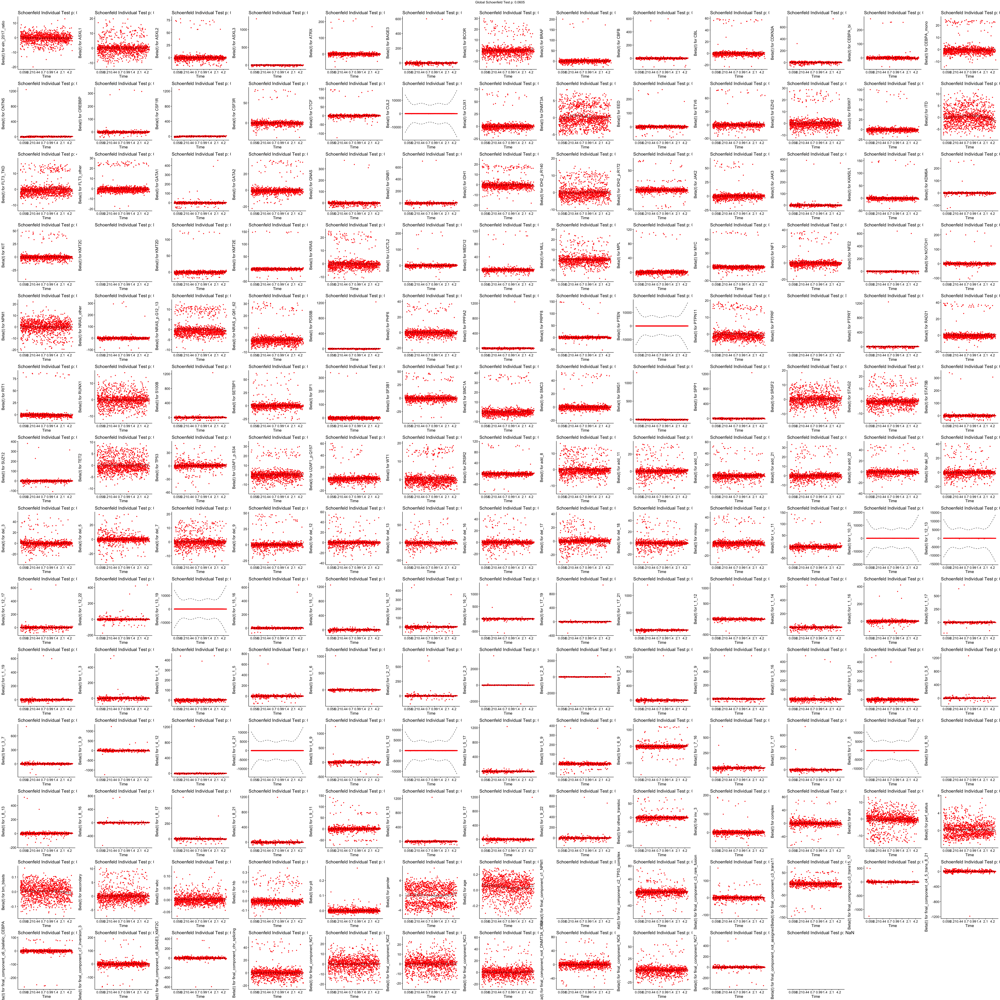

In [18]:
df_final <- read.table("prognosis_comp_final.tsv",sep='\t',header=T)
all_features <-c(1:180)
set_notebook_plot_size(50,50)
f1 <- as.formula(paste("Surv(os, os_status) ~ ",
                       paste(colnames(df_final[,all_features]), collapse= "+")))
res.cox <- coxph(f1,data=df_final)
test.ph <- cox.zph(res.cox)
#test.ph
ggcoxzph(test.ph)
#ggcoxdiagnostics(res.cox, type = "deviance",
#                 linear.predictions = FALSE, ggtheme = theme_bw())
#ggcoxfunctional(Surv(os, os_status) ~ age + log(age) + sqrt(age), data = df_final)
